In [1]:
from ultralytics import YOLO
import matplotlib.pyplot as plt
from IPython.display import display, Image
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import gc, torch

In [2]:
data_yaml_path = "../Datasets/Project4_SSDandYOLO/VehiclesDetectionDataset/dataset.yaml"
test_video_path = "../Datasets/Project4_SSDandYOLO/TestVideo/TrafficPolice.mp4"
image_folder = '../Datasets/Project4_SSDandYOLO/VehiclesDetectionDataset/test/images/'    
image_files = [file for file in os.listdir(image_folder) if file.endswith(('.jpg', '.png', '.jpeg'))]
sample_images = random.sample(image_files, 4)
################################################################ text print settings ################################################################
class color:
   PURPLE = '\033[95m'
   CYAN = '\033[96m'
   DARKCYAN = '\033[36m'
   BLUE = '\033[94m'
   GREEN = '\033[92m'
   YELLOW = '\033[93m'
   RED = '\033[91m'
   BOLD = '\033[1m'
   UNDERLINE = '\033[4m'
   END = '\033[0m'


################################################# Get list of image files and randomly sample images #################################################
def plot_samples(image_folder, model, model_type):    
    # Predict the object labels in the sample images
    results = model([os.path.join(image_folder, img) for img in sample_images])

    # Plot sample images with predicted labels
    plt.figure(figsize=(10, 10))
    if len(model.names) == 5:
        plt.suptitle(f'Object Detection: custom dataset-trained {model_type[:-3]} model')    
    else:
        plt.suptitle(f'Object Detection: pretrained {model_type[:-3]} model')
        
    for i, result in enumerate(results): # Iterate over the predicted objects in the sample images
        plt.subplot(2, 2, i+1)
        plt.imshow(result.plot())
        plt.axis("off")
    plt.tight_layout()
    plt.show()


############################################## Ploting the trained model evaluation metrics and results ##############################################
def metrics_plot():
    metric = -1
    plots = {
        1: 'results.png',
        2: 'confusion_matrix.png',
        3: 'confusion_matrix_normalized.png',
        4: 'F1_curve.png',
        5: 'P_curve.png',
        6: 'PR_curve.png',
        7: 'R_curve.png',
        8: 'labels.jpg',
        9: 'labels_correlogram.jpg'}
    while metric not in plots:
        print([[f"{i}: {plots[i]}"] for i in plots.keys()])
        metric= int(input("Which plot?: "))
        
        for folder in yolo11: # Iterate over results folders of each trained model for displaying the requested metric.
            print(150*'*')
            print(60*"*",f'    {color.BOLD}Model type: {color.RED+folder[:-3]+color.END}     ',60*"*")
            print(150*'*')
            display(Image(filename=f'Results_Project4_Vehicle Detection with YOLO/plots/{folder[:-3]}/{plots[metric]}'))

############################################################# training models using YOLO #############################################################
def train_yolo(model_type, epochs = 100, batch=2):
    print(150*'*')
    print(60*"*",f'    {color.BOLD}Model type: {color.RED+model_type[:-3]+color.END}     ',60*"*")
    print(150*'*')
    
    model = YOLO(model_type)

    # Ploting sample images of object detection via the pre-trained model
    plot_samples(image_folder,model, model_type)
    
    # Train the YOLO model
    train = model.train(
        data=data_yaml_path,   
        epochs=epochs,             
        batch=batch,               
        device=0,              
        amp=True,
        project="Results_Project4_Vehicle Detection with YOLO",  # Set custom directory (instead of "runs/detect")
        name=f"plots/{model_type[:-3]}"  # Name of the experiment (inside "Results_.../")
    )

    # Reload the model with updated weights
    trained_model_path = f"Results_Project4_Vehicle Detection with YOLO/plots/{model_type[:-3]}/weights/best.pt"
    model = YOLO(trained_model_path)  # Load the fine-tuned model

    # Ploting sample images object detection after training the model with the custom dataset
    plot_samples(image_folder,model, model_type)
    
    
    # Predicting via trained model on the Test video
    model.predict(
        source=test_video_path,  
        conf=0.5,
        save=True,  
        project="Results_Project4_Vehicle Detection with YOLO",
        name=f"test_video/{model_type[:-3]}" 
    )

    # Clear memory for preventing memory overflow
    del model, train
    torch.cuda.empty_cache()
    gc.collect()

******************************************************************************************************************************************************
************************************************************     Model type: yolo11n      ************************************************************
******************************************************************************************************************************************************

0: 640x640 11 persons, 55.5ms
1: 640x640 1 car, 1 truck, 55.5ms
2: 640x640 1 car, 55.5ms
3: 640x640 1 person, 1 bus, 55.5ms
Speed: 5.4ms preprocess, 55.5ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)


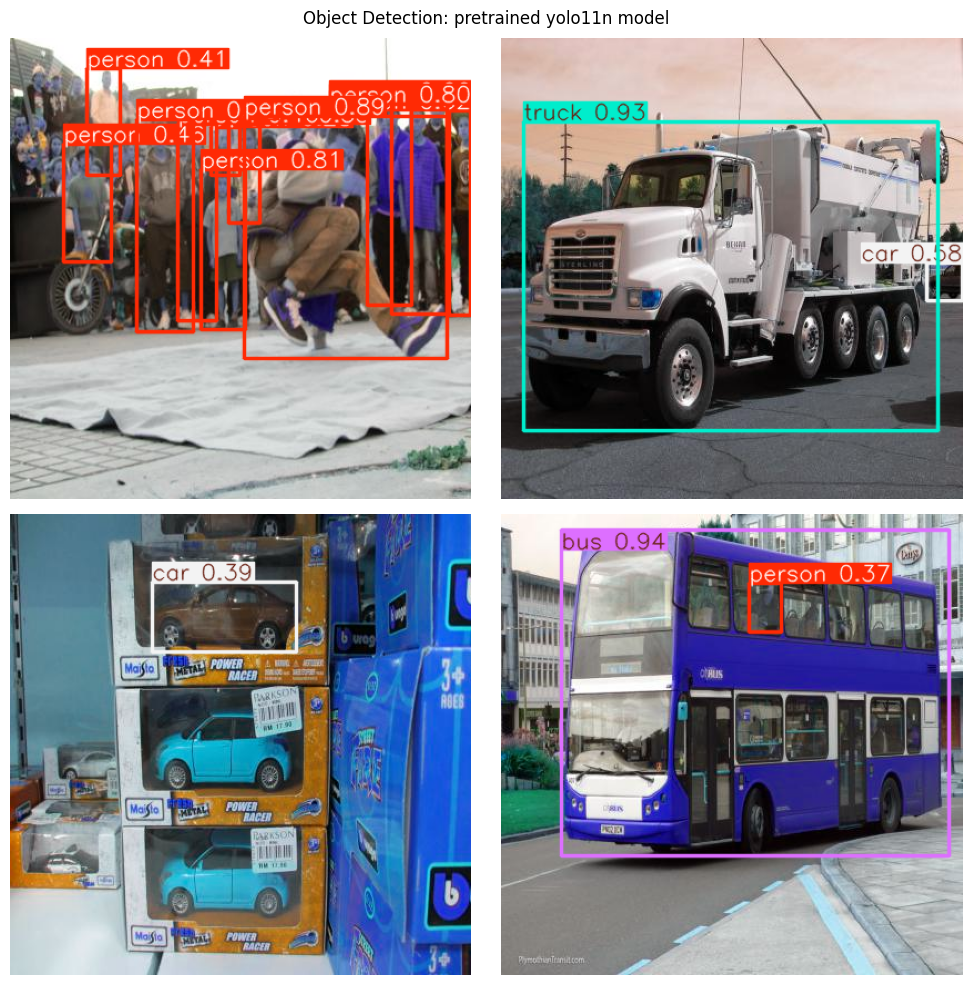

New https://pypi.org/project/ultralytics/8.3.88 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.85  Python-3.11.7 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolo11n.pt, data=../Datasets/Project4_SSDandYOLO/VehiclesDetectionDataset/dataset.yaml, epochs=100, time=None, patience=100, batch=2, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=Results_Project4_Vehicle Detection with YOLO, name=yolo11n, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=Fals

train: Scanning C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Datasets\Project4_SSDandYOLO\Vehicle
val: Scanning C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Datasets\Project4_SSDandYOLO\VehiclesD


Plotting labels to Results_Project4_Vehicle Detection with YOLO\plots\yolo11n\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Results_Project4_Vehicle Detection with YOLO\plots\yolo11n
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      0.68G      2.523      3.997       2.53         11        640: 100%|██████████| 439/439 [00:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04


                   all        250        454      0.306      0.194       0.11     0.0603

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100     0.664G       1.86      3.222      2.056          9        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.169      0.373      0.162     0.0952

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100     0.662G      1.684      2.977      1.949          4        640: 100%|██████████| 439/439 [00:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04


                   all        250        454        0.2       0.37      0.211      0.146

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100     0.662G      1.597      2.833      1.876          6        640: 100%|██████████| 439/439 [00:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.239      0.398      0.243      0.149

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100     0.662G       1.49        2.6      1.789          9        640: 100%|██████████| 439/439 [00:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04


                   all        250        454      0.347      0.408       0.34      0.224

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100     0.662G      1.432       2.51       1.72          7        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.361      0.405      0.356      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100     0.662G      1.331      2.355      1.661          5        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454       0.35        0.5      0.347      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100     0.662G      1.362      2.291      1.629          5        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.422      0.432      0.398      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100     0.662G      1.321      2.276      1.625          4        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.371      0.506       0.42      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100     0.662G      1.321      2.228      1.613          5        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.417      0.412      0.406       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100     0.662G      1.272      2.117      1.596         10        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.514      0.369      0.422      0.304

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100     0.662G      1.253      2.023      1.569          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.433      0.452      0.403      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100     0.662G      1.229      1.972      1.534          6        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.683      0.373      0.445      0.307



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100     0.662G      1.244      1.968      1.545         13        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.412       0.48      0.444       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100     0.662G      1.186      1.935       1.51         10        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.443       0.42      0.443      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      0.66G      1.175      1.859      1.495          7        640: 100%|██████████| 439/439 [00:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.397      0.527      0.459      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100     0.662G      1.142      1.895      1.479          5        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454       0.52      0.517      0.516      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      0.66G      1.156      1.783      1.491          3        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.517      0.506       0.53      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      0.66G       1.15      1.754      1.485         10        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.549      0.413      0.469      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      0.66G      1.158      1.741      1.461          8        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.684      0.443      0.514      0.356



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100     0.662G       1.11       1.71      1.456         10        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.645      0.467      0.477      0.337

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100     0.662G      1.142      1.713      1.472          5        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.575      0.502      0.524      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      0.66G       1.07      1.606      1.417         10        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.591      0.518      0.556        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      0.66G      1.117       1.66      1.435          2        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.527       0.48      0.514      0.365

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      0.66G      1.061      1.632      1.416          7        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.748      0.392      0.502      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      0.66G      1.069      1.592      1.419          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.579      0.514      0.523      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      0.66G      1.052       1.55      1.391          9        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454       0.56      0.552      0.542      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      0.66G      1.059      1.566        1.4          5        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454       0.56       0.53       0.55      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      0.66G      1.056      1.522      1.399          9        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454       0.65      0.515      0.579      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      0.66G      1.036      1.484      1.388          3        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.553      0.598      0.577       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      0.66G      1.029      1.465      1.383         12        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454       0.52      0.508      0.535      0.387

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      0.66G     0.9926      1.449      1.354          9        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.568      0.595      0.566      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      0.66G     0.9854      1.392      1.348          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.543      0.573      0.574      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      0.66G      1.006      1.438      1.365          6        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.586      0.609      0.588      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      0.66G     0.9915      1.365      1.355         10        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.603      0.574      0.594      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      0.66G     0.9772      1.369      1.336          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454       0.63      0.524      0.584      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      0.66G     0.9961      1.402      1.363         16        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.578      0.594      0.558      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      0.66G     0.9754      1.308      1.356          8        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.656      0.524      0.581      0.438

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100     0.662G     0.9704      1.337      1.343          8        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.542      0.561      0.558      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      0.66G     0.9395       1.28      1.318          8        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.611       0.51      0.563      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      0.66G     0.9639        1.3      1.339          4        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.538      0.566      0.569      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      0.66G     0.9882      1.327      1.349          7        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.644      0.504      0.568       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      0.66G     0.9485      1.256      1.312          4        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.653      0.488      0.559      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      0.66G     0.9587      1.272      1.328          5        640: 100%|██████████| 439/439 [01:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.664      0.489      0.579      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      0.66G     0.9356      1.262      1.319          9        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.564      0.565      0.588      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      0.66G     0.9299      1.221      1.302          4        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.674      0.551      0.607       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      0.66G     0.8965       1.19      1.276          5        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.603      0.551      0.582      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      0.66G     0.9281      1.211      1.305          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.587      0.554      0.565      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      0.66G     0.9093      1.184      1.289          6        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.643       0.49      0.575      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      0.66G     0.9122      1.202       1.29         15        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.655      0.502      0.577      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      0.66G      0.908      1.204        1.3         21        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.719      0.529      0.607      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      0.66G     0.8879       1.14      1.269          6        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.731        0.5      0.607      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      0.66G     0.8888      1.119      1.279          7        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.654      0.552      0.601      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      0.66G     0.8936      1.123       1.28          6        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.745      0.535       0.62      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      0.66G     0.8741      1.121      1.267          4        640: 100%|██████████| 439/439 [00:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.719      0.555      0.629       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100     0.662G     0.8913      1.145      1.275          5        640: 100%|██████████| 439/439 [00:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.595      0.597      0.591      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      0.66G     0.8492      1.056      1.253          6        640: 100%|██████████| 439/439 [01:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.612      0.569      0.595      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      0.66G     0.8651      1.105      1.266          2        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.626      0.567      0.597      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      0.66G     0.8474      1.046      1.249          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.637      0.564      0.595      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      0.66G     0.8655      1.067      1.262         11        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.684      0.573      0.601      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      0.66G     0.8555      1.068      1.246          4        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.601      0.557      0.574      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      0.66G     0.8238      1.022      1.224         15        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.649      0.523      0.598      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      0.66G     0.8274      1.008      1.234          7        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.652      0.531        0.6      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      0.66G     0.8407      1.029      1.239          7        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.666      0.503      0.578      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      0.66G     0.8306      1.003      1.245         16        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.594       0.58      0.597      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      0.66G     0.8128     0.9995       1.23          5        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.632      0.557      0.601       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      0.66G     0.8346     0.9798      1.229          4        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.609      0.562      0.564      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      0.66G     0.8119     0.9787      1.229          3        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.584      0.602      0.566      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      0.66G     0.8247     0.9962      1.228          1        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.583      0.594      0.584      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      0.66G     0.8365     0.9753      1.231         20        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.567      0.584      0.591      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      0.66G     0.8184     0.9458      1.213          3        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.519      0.606       0.57      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      0.66G     0.7831     0.9361      1.195          5        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.595      0.587      0.587      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      0.66G     0.8284     0.9692       1.23          9        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.638      0.605      0.604      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      0.66G     0.8065     0.9697      1.215          5        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.578      0.578      0.574      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      0.66G     0.7981     0.9317      1.206          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.634      0.535      0.569      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      0.66G     0.8092     0.9456      1.216         13        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.557      0.597      0.556      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      0.66G     0.7792     0.9179      1.198          9        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.567      0.626      0.591      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      0.66G     0.7881     0.9029      1.198          8        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.599      0.571      0.588      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      0.66G     0.7972     0.9036      1.212         17        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.646      0.543      0.595      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      0.66G     0.7974     0.9144      1.205         10        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.623      0.584       0.59      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      0.66G     0.7868     0.9215      1.204          7        640: 100%|██████████| 439/439 [00:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.636      0.575      0.606      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      0.66G     0.7671     0.8738      1.187          3        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.701      0.543        0.6      0.446

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      0.66G     0.7773     0.8803      1.199          8        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.639      0.537      0.605       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      0.66G      0.763     0.8505      1.179          3        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.729      0.504      0.586      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      0.66G      0.772     0.8805      1.189          5        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.615      0.562      0.587      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      0.66G     0.7622     0.8548      1.182          5        640: 100%|██████████| 439/439 [00:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.587      0.601      0.585      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      0.66G     0.7805     0.8808      1.187          6        640: 100%|██████████| 439/439 [01:00<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.745      0.491      0.597       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      0.66G     0.7534     0.8404       1.18          7        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.575      0.586      0.585      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      0.66G     0.7682      0.856      1.189          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.574       0.61      0.588       0.44



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      0.66G     0.7615     0.8388      1.177         14        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454       0.56      0.611       0.59      0.442


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      0.66G     0.6775     0.6566      1.135          3        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.711      0.529      0.586      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100     0.658G     0.6611     0.6383      1.115          6        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.699      0.529      0.604       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100     0.658G     0.6386     0.6095      1.099          5        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.736      0.509      0.597      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100     0.658G     0.6434     0.6097      1.102          3        640: 100%|██████████| 439/439 [00:59<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.733      0.515      0.588      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      0.66G     0.6195     0.5864      1.091          2        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.758      0.504      0.584      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100     0.658G     0.6179     0.5896      1.092          2        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:04

                   all        250        454      0.746      0.505      0.599      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      0.66G     0.6343     0.5734      1.093          2        640: 100%|██████████| 439/439 [00:58<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.743      0.508      0.592      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      0.66G     0.6118     0.5685      1.079          5        640: 100%|██████████| 439/439 [00:57<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.767      0.513      0.591      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      0.66G     0.6181      0.572      1.084          3        640: 100%|██████████| 439/439 [00:56<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.763      0.507      0.594      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      0.66G     0.6257     0.5654      1.094          3        640: 100%|██████████| 439/439 [00:55<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03

                   all        250        454      0.722      0.514      0.591      0.453



100 epochs completed in 1.731 hours.
Optimizer stripped from Results_Project4_Vehicle Detection with YOLO\plots\yolo11n\weights\last.pt, 5.5MB
Optimizer stripped from Results_Project4_Vehicle Detection with YOLO\plots\yolo11n\weights\best.pt, 5.5MB

Validating Results_Project4_Vehicle Detection with YOLO\plots\yolo11n\weights\best.pt...
Ultralytics 8.3.85  Python-3.11.7 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
YOLO11n summary (fused): 100 layers, 2,583,127 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:03


                   all        250        454      0.745      0.537       0.62       0.47
             Ambulance         50         64      0.881       0.75       0.87      0.755
                   Bus         30         46      0.687      0.574      0.633        0.5
                   Car         90        238      0.726      0.445       0.54      0.374
            Motorcycle         42         46      0.796      0.565      0.635      0.417
                 Truck         38         60      0.636      0.349       0.42      0.305
Speed: 0.5ms preprocess, 6.7ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to Results_Project4_Vehicle Detection with YOLO\plots\yolo11n

0: 640x640 1 Motorcycle, 21.3ms
1: 640x640 1 Car, 1 Truck, 21.3ms
2: 640x640 2 Cars, 21.3ms
3: 640x640 1 Bus, 21.3ms
Speed: 3.5ms preprocess, 21.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)


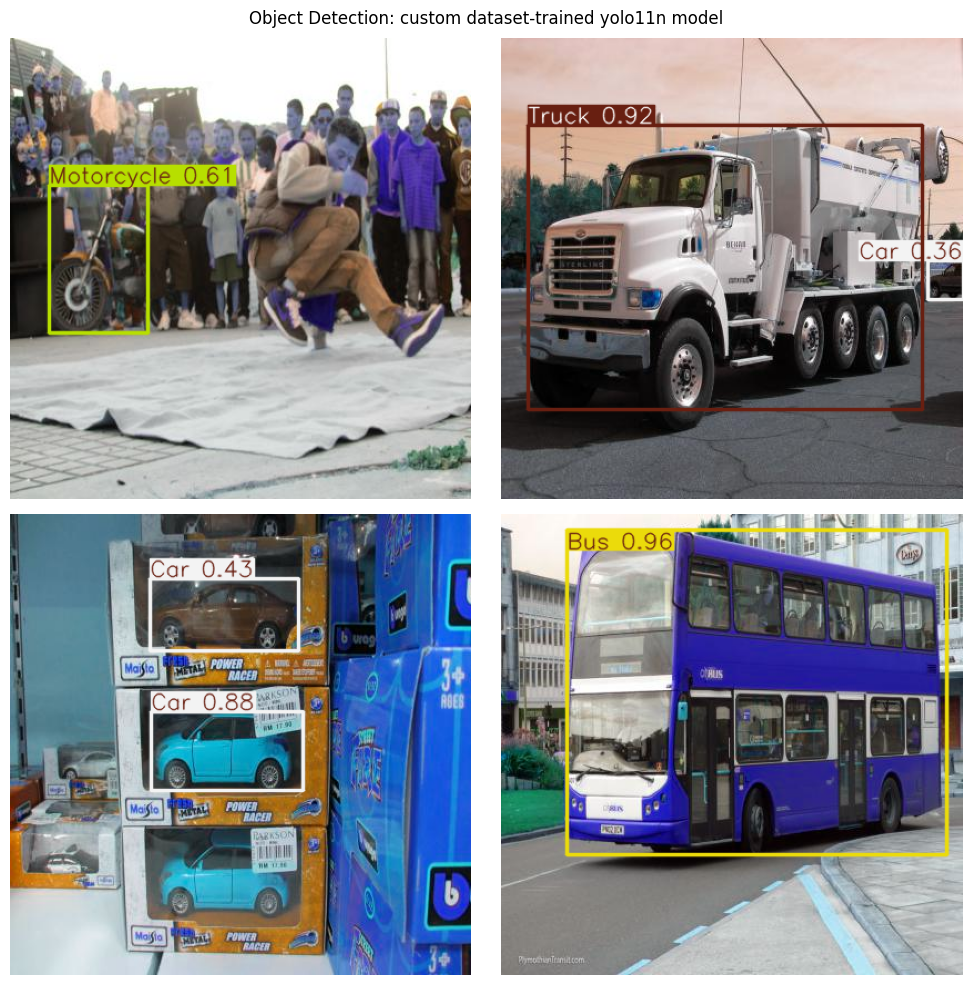



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Notebooks\..\Datasets\Project4_SSDandYOLO\TestVideo\TrafficPolice.mp4: 384x640 5 Cars, 1 Truck, 41.3ms
video 1/1 (frame 2/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Notebooks\..\Datasets\Project4_SSDandYOLO\TestVideo\TrafficPolice.mp4: 384x640 6 Cars, 1 Truck, 16.5ms
video 1/1 (frame 3/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep L

      1/100      1.49G      2.178      3.561      2.347         11        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.401      0.335      0.277       0.17



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      1.51G      1.634      2.712      1.912          9        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.367      0.439      0.368      0.243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      1.51G      1.493      2.467      1.806          4        640: 100%|██████████| 439/439 [01:36<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.358      0.387      0.334      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      1.53G      1.439      2.364      1.768          6        640: 100%|██████████| 439/439 [01:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.415      0.391      0.376      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      1.51G      1.389      2.161      1.705          9        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.671      0.398      0.479      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      1.53G       1.36      2.103       1.65          7        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.616      0.399      0.449      0.304



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      1.51G      1.291      2.029      1.617          5        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.461      0.493      0.427      0.257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      1.53G      1.282      1.931      1.588          5        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.579      0.481       0.51      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      1.51G      1.225       1.88      1.563          4        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.612      0.484      0.527      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      1.53G      1.246      1.847      1.561          5        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.607       0.53      0.519      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      1.51G       1.19       1.77      1.532         10        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.506      0.562      0.559      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      1.53G      1.176      1.671      1.525          6        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454       0.56      0.518      0.537      0.356

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      1.51G      1.153      1.632      1.486          6        640: 100%|██████████| 439/439 [01:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.584      0.509      0.568      0.401

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      1.53G      1.158       1.59      1.486         13        640: 100%|██████████| 439/439 [01:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.594      0.519      0.527      0.386

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      1.51G      1.121      1.569      1.459         10        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.698      0.538      0.595       0.45

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      1.53G      1.092      1.506      1.434          7        640: 100%|██████████| 439/439 [01:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.625      0.543      0.558      0.397

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      1.51G      1.064      1.492      1.419          5        640: 100%|██████████| 439/439 [01:34<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.593      0.527       0.53      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      1.53G      1.066      1.429      1.434          3        640: 100%|██████████| 439/439 [01:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.602      0.616      0.616       0.46



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      1.52G      1.042      1.383      1.409         10        640: 100%|██████████| 439/439 [01:35<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.587      0.509      0.524      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      1.53G      1.041      1.362      1.386          8        640: 100%|██████████| 439/439 [01:53<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.657      0.566      0.615      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      1.51G      1.001      1.326      1.379         10        640: 100%|██████████| 439/439 [02:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.573      0.582      0.564      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      1.53G      1.015      1.305      1.387          5        640: 100%|██████████| 439/439 [02:04<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.706      0.569      0.624      0.451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      1.51G     0.9651      1.226       1.35         10        640: 100%|██████████| 439/439 [02:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454       0.67      0.583       0.63      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      1.53G      1.004      1.303      1.366          2        640: 100%|██████████| 439/439 [02:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.521      0.589      0.564      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      1.51G       0.96      1.217      1.351          7        640: 100%|██████████| 439/439 [02:02<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.675      0.564      0.616      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      1.53G      0.967      1.192      1.348          6        640: 100%|██████████| 439/439 [02:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.715      0.559       0.63      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      1.51G     0.9647      1.159      1.337          9        640: 100%|██████████| 439/439 [02:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.612      0.603      0.609      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      1.53G     0.9551      1.209      1.327          5        640: 100%|██████████| 439/439 [02:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.594      0.569      0.576      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      1.51G      0.925      1.125      1.312          9        640: 100%|██████████| 439/439 [02:03<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:08

                   all        250        454      0.657      0.557      0.627      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      1.53G     0.9111      1.106      1.306          3        640: 100%|██████████| 439/439 [50:32<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:07

                   all        250        454      0.721        0.6      0.621      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      1.51G       0.93      1.126      1.309         12        640: 100%|██████████| 439/439 [01:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.664       0.59       0.62      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      1.53G     0.8833      1.046      1.285          9        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.752      0.514      0.622      0.456

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      1.51G     0.8942      1.061      1.285          6        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.631      0.568      0.604      0.457

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      1.53G     0.9016      1.079      1.296          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.567      0.609      0.609      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      1.51G     0.8668      1.011      1.265         10        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.672      0.606      0.625      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      1.53G     0.8677      1.014      1.264          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.605      0.605      0.575      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      1.51G      0.884      1.028      1.286         16        640: 100%|██████████| 439/439 [01:41<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.672      0.528      0.602      0.452

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      1.53G     0.8342     0.9472      1.254          8        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.579      0.599      0.597      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      1.51G      0.859     0.9892      1.262          8        640: 100%|██████████| 439/439 [01:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:07

                   all        250        454      0.673      0.569      0.565      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      1.53G     0.8285     0.9294      1.241          8        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.638       0.61      0.607      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      1.51G     0.8434      0.924      1.255          4        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.686      0.526       0.59      0.435

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      1.53G     0.8516     0.9854      1.254          7        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.622      0.578      0.608      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      1.51G      0.827     0.8979       1.23          4        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.593      0.595      0.567      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      1.53G     0.8261     0.9004      1.228          5        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.574      0.556       0.56      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      1.51G     0.8063     0.8504       1.23          9        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.566      0.579      0.576       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      1.53G     0.8002     0.8633      1.207          4        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.656      0.545        0.6      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      1.51G     0.7767     0.8746      1.187          5        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.583      0.598      0.569      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      1.53G     0.8074     0.8815       1.22          6        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.624       0.57      0.567      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      1.51G     0.7707      0.827      1.191          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.685      0.547      0.621      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      1.53G     0.7732     0.8228      1.186         15        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.691      0.554      0.621      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      1.52G     0.7681     0.8345      1.202         21        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.688      0.541      0.581      0.443

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      1.53G     0.7437      0.796      1.171          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.641       0.58      0.627      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      1.51G     0.7397     0.7506      1.174          7        640: 100%|██████████| 439/439 [01:37<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.606      0.567      0.587      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      1.53G     0.7515     0.7678      1.174          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.596      0.601      0.591      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      1.51G     0.7504     0.7938      1.183          4        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.606      0.573      0.598      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      1.53G     0.7466     0.7923      1.179          5        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.555       0.62      0.593      0.448

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      1.51G     0.7091     0.7407      1.156          6        640: 100%|██████████| 439/439 [01:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.583      0.623      0.595      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      1.53G      0.722     0.7621       1.16          2        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.657      0.555      0.583      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      1.51G     0.6958     0.7124      1.141          6        640: 100%|██████████| 439/439 [01:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.641      0.543      0.596      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      1.53G     0.7189     0.6985      1.162         11        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.635      0.575      0.595      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      1.51G     0.7118     0.7111      1.145          4        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.666      0.545      0.581      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      1.53G     0.6818     0.7112      1.128         15        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.628      0.564      0.576      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      1.51G     0.6863     0.6889      1.134          7        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.626       0.57      0.598      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      1.53G     0.6992      0.694      1.141          7        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.756      0.515      0.601      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      1.51G     0.6808     0.6683      1.136         16        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.579      0.612       0.61      0.444

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      1.53G     0.6513      0.663      1.126          5        640: 100%|██████████| 439/439 [01:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:07

                   all        250        454      0.583      0.586      0.604      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      1.51G     0.6664     0.6523      1.114          4        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.619      0.605      0.621      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      1.53G     0.6567     0.6403      1.122          3        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:07


                   all        250        454      0.562      0.639      0.617      0.466

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      1.51G     0.6606     0.6675       1.12          1        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454       0.66      0.576      0.611      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      1.53G     0.6621     0.6343      1.119         20        640: 100%|██████████| 439/439 [01:40<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:07


                   all        250        454      0.637       0.54      0.605      0.458

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      1.51G     0.6655     0.6439      1.113          3        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.655      0.601      0.626      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      1.53G      0.625     0.6233      1.093          5        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.596      0.595      0.591      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      1.51G     0.6508     0.6605      1.116          9        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.642      0.564      0.624      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      1.53G      0.654     0.6417      1.119          5        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.707      0.555      0.611      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      1.51G      0.633      0.623      1.104          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.606      0.613      0.613       0.47

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      1.53G     0.6302     0.6256      1.104         13        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.727      0.557      0.621      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      1.51G     0.6105     0.5788      1.092          9        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.727      0.566      0.638      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      1.53G     0.6155     0.5796      1.084          8        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.663      0.567      0.634      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      1.51G     0.6203     0.5653      1.092         17        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.647      0.635      0.634      0.487

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      1.53G     0.6194     0.5864      1.083         10        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.607      0.629      0.648      0.491

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      1.51G      0.617     0.5834      1.091          7        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.625      0.596       0.61      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      1.53G     0.6005     0.5661      1.076          3        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.656      0.589      0.632      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      1.52G     0.6032     0.5652      1.086          8        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.725      0.574      0.629      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      1.53G      0.579     0.5344      1.061          3        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454       0.65      0.581      0.613      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      1.51G     0.5924     0.5405      1.079          5        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.628      0.599      0.609      0.469

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      1.53G     0.5943     0.5554       1.08          5        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.606       0.61       0.61      0.473



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      1.51G     0.5892     0.5453      1.061          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.668      0.561      0.604      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      1.53G     0.5822     0.5342      1.071          7        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.685      0.539      0.602      0.474

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      1.51G      0.582     0.5272      1.059          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.662      0.562      0.604      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      1.53G      0.578     0.5289       1.06         14        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.583      0.615      0.612      0.472


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100       1.5G     0.4765      0.382     0.9955          3        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.543       0.62      0.581      0.453

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      1.52G     0.4613     0.3581     0.9792          6        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.634      0.571      0.588      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100       1.5G     0.4481     0.3476     0.9664          5        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.567      0.653       0.59      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      1.52G     0.4456     0.3428     0.9681          3        640: 100%|██████████| 439/439 [01:39<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.661      0.598      0.591      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100       1.5G     0.4328     0.3319     0.9627          2        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06


                   all        250        454      0.639      0.586      0.591      0.454

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      1.52G     0.4288     0.3384     0.9684          2        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.623      0.603      0.594      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100       1.5G     0.4443      0.329     0.9644          2        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.623      0.597      0.594      0.459



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      1.52G     0.4213     0.3285      0.952          5        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.645      0.583      0.589      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100       1.5G       0.41     0.3179     0.9413          3        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.662      0.588      0.598      0.462



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      1.52G     0.4247      0.324     0.9596          3        640: 100%|██████████| 439/439 [01:38<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:06

                   all        250        454      0.634      0.589      0.597       0.46



100 epochs completed in 3.837 hours.
Optimizer stripped from Results_Project4_Vehicle Detection with YOLO\plots\yolo11s\weights\last.pt, 19.2MB
Optimizer stripped from Results_Project4_Vehicle Detection with YOLO\plots\yolo11s\weights\best.pt, 19.2MB

Validating Results_Project4_Vehicle Detection with YOLO\plots\yolo11s\weights\best.pt...
Ultralytics 8.3.85  Python-3.11.7 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
YOLO11s summary (fused): 100 layers, 9,414,735 parameters, 0 gradients, 21.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:05


                   all        250        454      0.609      0.629      0.648      0.491
             Ambulance         50         64      0.725      0.781      0.833      0.692
                   Bus         30         46      0.543      0.783       0.79      0.679
                   Car         90        238      0.624      0.588      0.595      0.421
            Motorcycle         42         46      0.627      0.586      0.597      0.344
                 Truck         38         60      0.527      0.408      0.424      0.319
Speed: 0.6ms preprocess, 16.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to Results_Project4_Vehicle Detection with YOLO\plots\yolo11s

0: 640x640 (no detections), 42.2ms
1: 640x640 1 Truck, 42.2ms
2: 640x640 3 Cars, 42.2ms
3: 640x640 1 Bus, 42.2ms
Speed: 3.7ms preprocess, 42.2ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


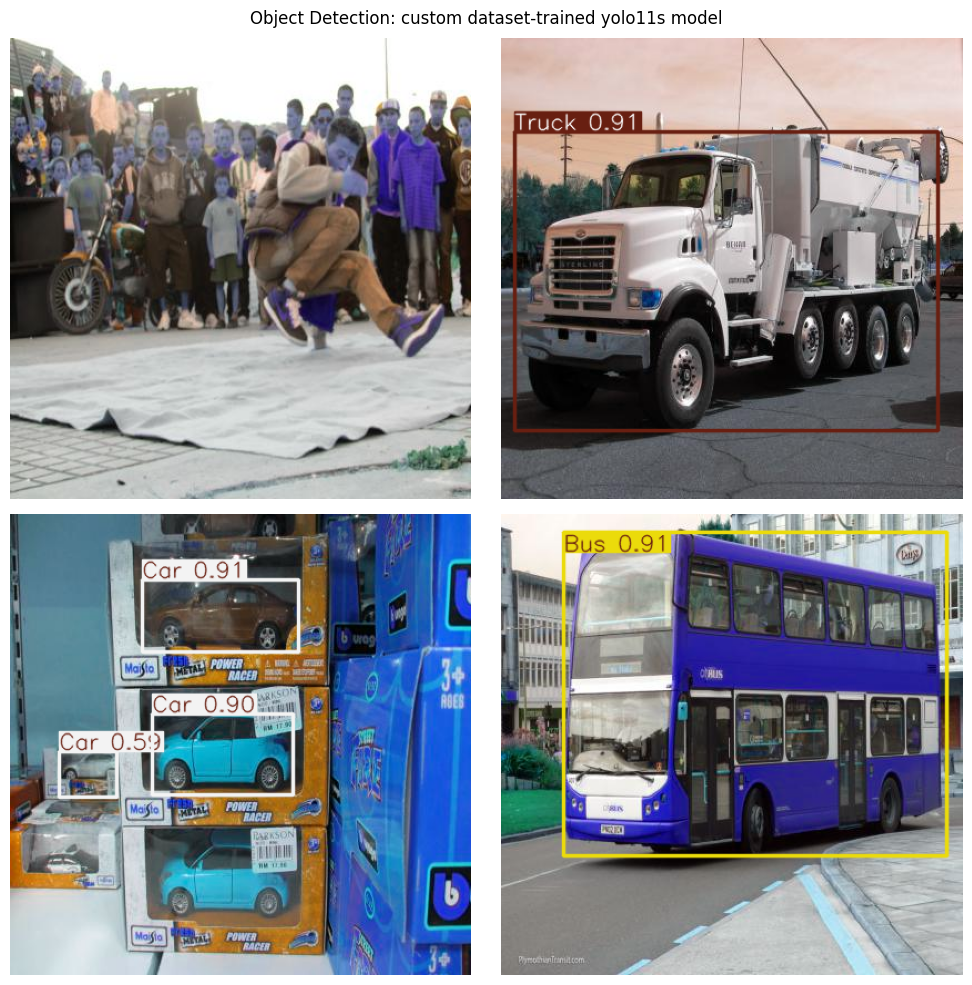



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Notebooks\..\Datasets\Project4_SSDandYOLO\TestVideo\TrafficPolice.mp4: 384x640 4 Cars, 80.9ms
video 1/1 (frame 2/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Notebooks\..\Datasets\Project4_SSDandYOLO\TestVideo\TrafficPolice.mp4: 384x640 5 Cars, 20.2ms
video 1/1 (frame 3/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - M

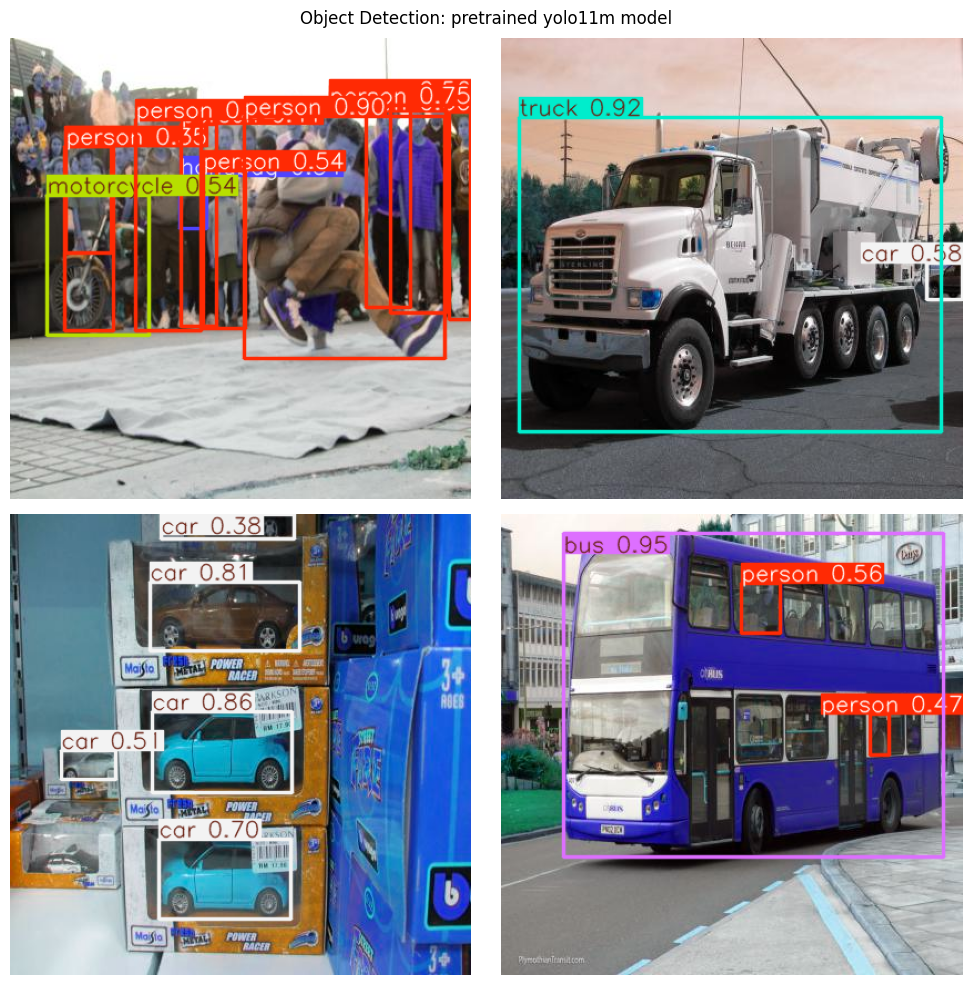

New https://pypi.org/project/ultralytics/8.3.88 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.85  Python-3.11.7 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
engine\trainer: task=detect, mode=train, model=yolo11m.pt, data=../Datasets/Project4_SSDandYOLO/VehiclesDetectionDataset/dataset.yaml, epochs=100, time=None, patience=100, batch=2, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=Results_Project4_Vehicle Detection with YOLO, name=yolo11m, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=Fals

train: Scanning C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Datasets\Project4_SSDandYOLO\Vehicle
val: Scanning C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Datasets\Project4_SSDandYOLO\VehiclesD


Plotting labels to Results_Project4_Vehicle Detection with YOLO\plots\yolo11m\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001111, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to Results_Project4_Vehicle Detection with YOLO\plots\yolo11m
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      2.68G      2.145        3.4      2.444         11        640: 100%|██████████| 439/439 [03:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14


                   all        250        454      0.221      0.351      0.235      0.154

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      2.66G      1.599      2.561      1.951          9        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14


                   all        250        454      0.281      0.504      0.349      0.223

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      2.66G      1.481      2.355      1.851          4        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454       0.43      0.408      0.325      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      2.66G      1.448      2.271      1.827          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.378      0.399      0.373      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      2.66G      1.353      2.083       1.72          9        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.606       0.36      0.418      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      2.65G      1.334      2.037      1.676          7        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.685      0.386      0.504      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      2.66G      1.252      1.936      1.631          5        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.423      0.463      0.443      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      2.64G      1.245      1.848      1.598          5        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.505      0.505      0.474      0.314



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      2.66G      1.196      1.818      1.585          4        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.532      0.513      0.525      0.378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      2.66G      1.247      1.809      1.604          5        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.425      0.477      0.454      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      2.66G      1.183      1.719      1.581         10        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.487      0.532       0.52      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      2.65G      1.132      1.619      1.522          6        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:15

                   all        250        454      0.554      0.529      0.552      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      2.66G      1.139      1.592      1.501          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.487      0.557      0.502      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      2.65G      1.134      1.534      1.509         13        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.618      0.498      0.555      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      2.66G      1.069      1.546      1.466         10        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.534      0.558      0.549      0.401



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      2.65G      1.075      1.437      1.454          7        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.681      0.497      0.545      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      2.66G      1.035      1.458      1.448          5        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.663      0.484       0.57      0.414



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      2.65G      1.037      1.372       1.45          3        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.588      0.545      0.555      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      2.62G      1.028      1.347      1.445         10        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.648      0.477      0.558      0.395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      2.66G      1.036       1.34      1.423          8        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.653      0.527      0.605       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      2.66G     0.9869      1.322      1.408         10        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.628      0.528       0.57      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      2.66G       1.01      1.259      1.416          5        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.68      0.525      0.595      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      2.66G     0.9421      1.204      1.367         10        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.59      0.551      0.587      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      2.66G      0.963      1.253      1.388          2        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.526       0.53      0.526      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      2.66G     0.9263      1.203      1.367          7        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.685       0.53      0.612      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      2.65G     0.9298      1.159      1.356          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.678      0.595      0.621      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      2.66G     0.9176      1.123      1.346          9        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.706      0.604      0.655        0.5



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      2.64G     0.8903      1.153      1.324          5        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.583      0.545      0.568      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      2.66G      0.891      1.088      1.327          9        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.713      0.533      0.615      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      2.66G     0.8795      1.048      1.325          3        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.644      0.537      0.585      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      2.66G     0.8845      1.064      1.318         12        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.583      0.535      0.548      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      2.66G     0.8422      1.014      1.291          9        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.655       0.57      0.582      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      2.66G     0.8482     0.9703      1.282          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.536      0.546      0.546      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      2.65G     0.8509     0.9939      1.282          6        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454       0.63      0.545       0.59      0.442



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      2.66G     0.8388     0.9822      1.272         10        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.576      0.552      0.579      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      2.64G     0.8232     0.9214      1.276          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.578      0.549      0.574      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      2.66G      0.831     0.9444      1.289         16        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.548       0.59      0.604      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      2.66G     0.8019     0.9003      1.269          8        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.589      0.574      0.594      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      2.66G     0.8121     0.9317      1.264          8        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.505      0.603      0.532      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      2.66G     0.7703     0.8613      1.237          8        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.629      0.539      0.584      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      2.66G     0.7854     0.8752      1.244          4        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.508      0.549      0.573      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      2.66G      0.797     0.8908      1.255          7        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.629      0.543      0.606      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      2.66G     0.7863     0.8315      1.234          4        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.608      0.557      0.579      0.443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      2.65G     0.7705     0.8669      1.231          5        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.663      0.512      0.591       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      2.66G     0.7692     0.8358      1.233          9        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.563      0.591      0.605      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      2.64G     0.7322      0.802      1.193          4        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.713        0.5      0.607      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      2.66G     0.7188     0.8089      1.186          5        640: 100%|██████████| 439/439 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.666      0.523      0.593      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      2.66G     0.7453     0.8394      1.213          6        640: 100%|██████████| 439/439 [03:16<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.571      0.532      0.563      0.441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      2.66G     0.7155     0.7733      1.186          6        640: 100%|██████████| 439/439 [03:17<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.686      0.539      0.601      0.449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      2.66G     0.7165     0.7772      1.189         15        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.546      0.538      0.559      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      2.62G     0.7061     0.7745      1.194         21        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.727       0.48      0.573      0.435



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      2.66G     0.6951     0.7326      1.165          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.707      0.541      0.624      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      2.66G     0.6823     0.7187      1.161          7        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.575      0.591      0.586      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      2.66G     0.6851     0.7102       1.16          6        640: 100%|██████████| 439/439 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.671       0.52        0.6      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      2.66G     0.6673     0.7333      1.158          4        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.711      0.535      0.604      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      2.66G     0.6877     0.7398       1.17          5        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.555      0.584      0.599      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      2.66G     0.6441     0.6537      1.139          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.695       0.56      0.623      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      2.65G     0.6559     0.6961      1.137          2        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.591      0.596      0.592      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      2.66G     0.6238     0.6417      1.123          6        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.56      0.593      0.564      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      2.64G     0.6489      0.664       1.15         11        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.573      0.647      0.614      0.458



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      2.66G     0.6299     0.6505      1.118          4        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.672      0.506      0.604      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      2.66G     0.6201     0.6534      1.117         15        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.673      0.538      0.603      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      2.66G     0.6176     0.6165      1.125          7        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.68      0.522      0.574      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      2.66G     0.6176     0.6089      1.119          7        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.68      0.501      0.571      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      2.66G      0.609     0.5885      1.125         16        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.592       0.59      0.591      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      2.65G     0.5866     0.5957      1.112          5        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.644      0.554       0.59      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      2.66G     0.6155     0.6177      1.115          4        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.528      0.625      0.566      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      2.65G     0.5937     0.5739      1.109          3        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.595      0.573      0.605      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      2.66G     0.5984      0.605      1.107          1        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.646      0.541      0.601      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      2.65G     0.6028     0.5855      1.111         20        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.622      0.568      0.593      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      2.66G     0.5845     0.5678      1.092          3        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.659      0.537      0.601      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      2.64G     0.5572     0.5436      1.073          5        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.699      0.551      0.624       0.48



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      2.66G     0.5774     0.5776      1.089          9        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.689      0.555       0.61      0.475



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      2.66G     0.5802     0.5701      1.097          5        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.681      0.534      0.612      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      2.66G     0.5681     0.5565      1.085          6        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.651      0.609      0.629      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      2.66G     0.5589     0.5415      1.081         13        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.623      0.551      0.605      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      2.66G     0.5325     0.5253      1.063          9        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.563      0.612       0.61      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      2.65G     0.5378     0.5127      1.064          8        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.618       0.61      0.627      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      2.66G       0.55     0.5264      1.074         17        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.719      0.521      0.621      0.479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      2.65G     0.5496     0.5194      1.072         10        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.623      0.551      0.603      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      2.66G     0.5308      0.501      1.066          7        640: 100%|██████████| 439/439 [03:13<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.597      0.613       0.62      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      2.64G     0.5243     0.4909      1.059          3        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.58      0.641      0.625      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      2.62G     0.5231     0.4812      1.062          8        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.77       0.49      0.606      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      2.66G     0.4986     0.4773      1.038          3        640: 100%|██████████| 439/439 [03:12<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.641      0.551      0.611      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      2.66G     0.5183     0.4791      1.055          5        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.735      0.513      0.609      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      2.66G     0.5085     0.4902       1.05          5        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.697      0.529      0.618      0.463



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      2.66G     0.5245      0.493      1.051          6        640: 100%|██████████| 439/439 [03:11<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.642      0.569      0.617       0.47



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      2.66G     0.5035     0.4647      1.048          7        640: 100%|██████████| 439/439 [03:23<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.737      0.501      0.612      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      2.66G     0.4927     0.4598      1.034          6        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.773      0.482      0.624      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      2.66G     0.4942     0.4597      1.036         14        640: 100%|██████████| 439/439 [03:10<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.674       0.52      0.614       0.47


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      2.66G     0.3953     0.3122      0.959          3        640: 100%|██████████| 439/439 [03:14<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.749      0.525      0.601      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      2.66G     0.3739     0.2967     0.9419          6        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:14

                   all        250        454      0.717      0.528      0.623      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      2.66G     0.3662     0.2822     0.9325          5        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.688      0.544      0.617      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      2.66G     0.3628     0.2796     0.9353          3        640: 100%|██████████| 439/439 [03:10<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.556        0.6      0.597      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      2.66G     0.3513     0.2675     0.9281          2        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.716      0.523      0.603      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      2.65G     0.3546     0.2832     0.9383          2        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.664      0.567      0.621      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      2.66G     0.3579      0.268     0.9302          2        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.669      0.552      0.622      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      2.65G     0.3453     0.2663     0.9225          5        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454       0.62      0.585      0.623      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      2.66G     0.3402     0.2649     0.9201          3        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.681      0.544      0.616      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      2.64G     0.3439     0.2641     0.9248          3        640: 100%|██████████| 439/439 [03:09<00:00,  
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:13

                   all        250        454      0.752      0.509       0.62      0.473



100 epochs completed in 5.780 hours.
Optimizer stripped from Results_Project4_Vehicle Detection with YOLO\plots\yolo11m\weights\last.pt, 40.5MB
Optimizer stripped from Results_Project4_Vehicle Detection with YOLO\plots\yolo11m\weights\best.pt, 40.5MB

Validating Results_Project4_Vehicle Detection with YOLO\plots\yolo11m\weights\best.pt...
Ultralytics 8.3.85  Python-3.11.7 torch-2.6.0+cu118 CUDA:0 (NVIDIA GeForce GTX 1650, 4096MiB)
YOLO11m summary (fused): 125 layers, 20,033,887 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:12


                   all        250        454       0.71      0.604      0.655      0.499
             Ambulance         50         64      0.849      0.938      0.933      0.801
                   Bus         30         46      0.719      0.783      0.792      0.648
                   Car         90        238      0.701      0.454      0.517      0.361
            Motorcycle         42         46      0.595      0.478       0.52      0.302
                 Truck         38         60      0.686      0.367      0.511      0.383
Speed: 0.7ms preprocess, 44.5ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to Results_Project4_Vehicle Detection with YOLO\plots\yolo11m

0: 640x640 (no detections), 44.9ms
1: 640x640 1 Car, 1 Truck, 44.9ms
2: 640x640 2 Cars, 1 Truck, 44.9ms
3: 640x640 3 Buss, 44.9ms
Speed: 3.5ms preprocess, 44.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


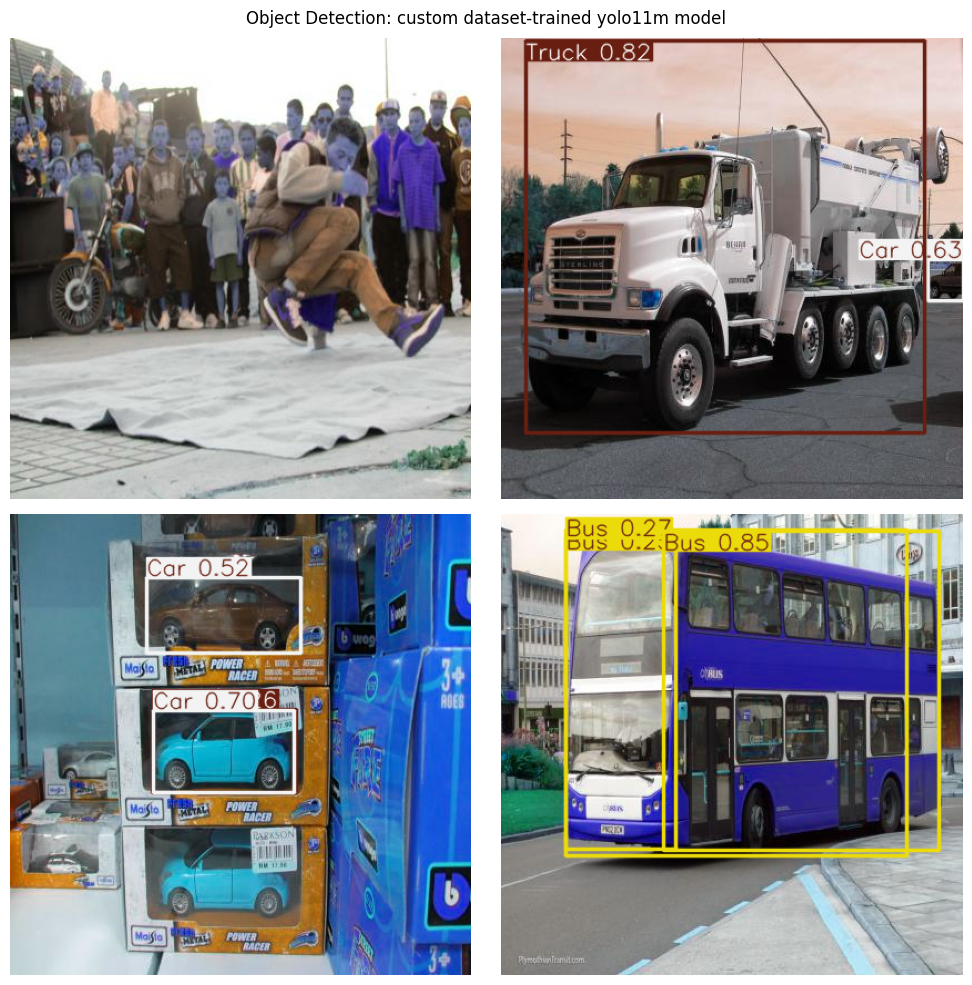



WARNING  inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Notebooks\..\Datasets\Project4_SSDandYOLO\TestVideo\TrafficPolice.mp4: 384x640 6 Cars, 35.2ms
video 1/1 (frame 2/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - Momeni\Notebooks\..\Datasets\Project4_SSDandYOLO\TestVideo\TrafficPolice.mp4: 384x640 6 Cars, 23.8ms
video 1/1 (frame 3/2362) C:\Users\ACER\Jupyter_Notebook_Files\Deep Learning Course - M

In [3]:
yolo11 = ['yolo11n.pt' , 'yolo11s.pt' , 'yolo11m.pt']#, 'yolo11l.pt' , 'yolo11x.pt' ]

for model_type in yolo11:
    train_yolo(model_type)

[['1: results.png'], ['2: confusion_matrix.png'], ['3: confusion_matrix_normalized.png'], ['4: F1_curve.png'], ['5: P_curve.png'], ['6: PR_curve.png'], ['7: R_curve.png'], ['8: labels.jpg'], ['9: labels_correlogram.jpg']]


Which plot?:  1


******************************************************************************************************************************************************
************************************************************     Model type: yolo11n      ************************************************************
******************************************************************************************************************************************************


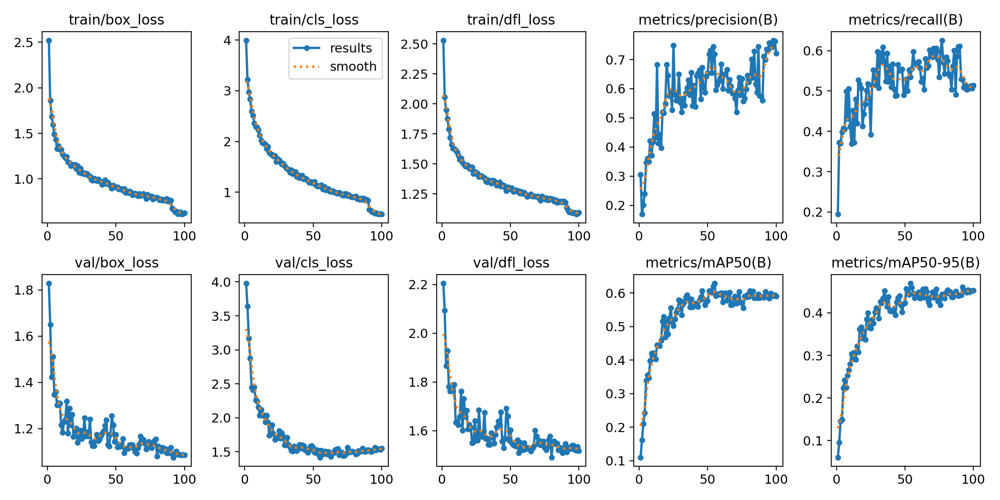

******************************************************************************************************************************************************
************************************************************     Model type: yolo11s      ************************************************************
******************************************************************************************************************************************************


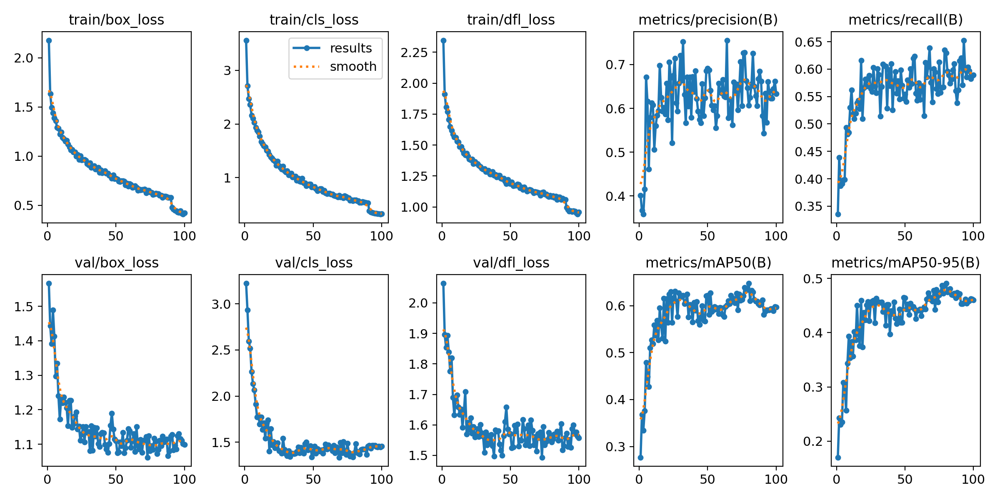

******************************************************************************************************************************************************
************************************************************     Model type: yolo11m      ************************************************************
******************************************************************************************************************************************************


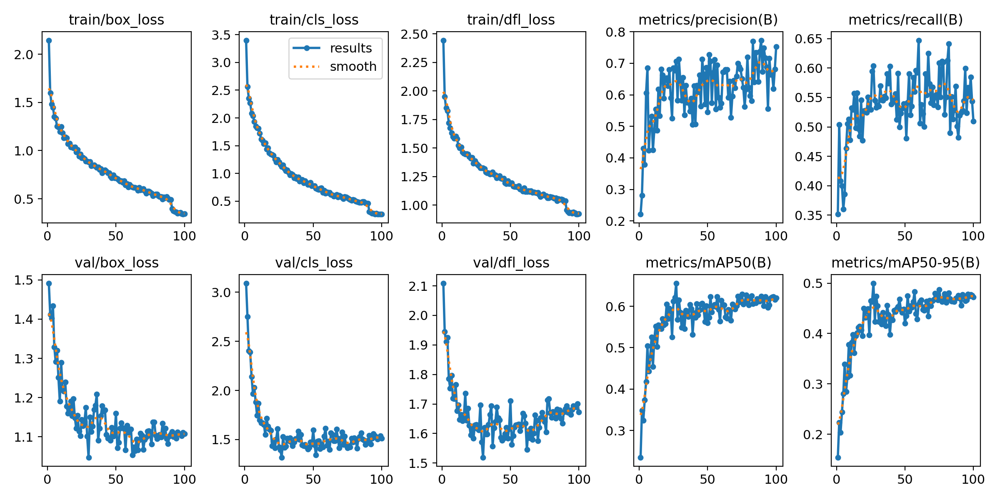

In [4]:
metrics_plot()